In [36]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import mudata as md
import networkx as nx
import matplotlib.pyplot as plt

import gc
import sys
sys.path.append('../')

from utils.gglasso_pipeline import gg_lasso_network_analysis
from utils.utils import calc_sparsity
from sklearn.covariance import empirical_covariance
from latentcor import latentcor

### EC

In [2]:
ec_mudata = md.read("../data/preprocessed/ec_mudata_preprocessed.h5mu")
ec_adata = ec_mudata["rRNA_genes"].copy()
del(ec_mudata)
print(gc.collect())
ec_adata

c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


1492


c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\mudata\_core\mudata.py:491: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


AnnData object with n_obs × n_vars = 2524 × 60
    obs: 'strains', 'n_genes_by_counts', 'total_counts', 'n_counts'
    var: 'strains', 'matchin_protein', 'protein', 'n_cells', 'protein_name', 'rRNA', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'genes_match', 'protein_match', 'unmatch_genes'
    layers: 'log1p', 'norm_counts', 'raw_counts', 'sqrt_counts'

In [3]:
print(ec_adata.shape)
sc.pp.filter_genes(ec_adata, min_counts=1)
print(ec_adata.shape)
sc.pp.filter_cells(ec_adata, min_counts=1)
print(ec_adata.shape)

(2524, 60)
(2524, 57)
(2466, 57)


In [4]:
print("Sparity:\t\t", calc_sparsity(ec_adata.X.A))
print("Mean counts per gene:\t", np.mean(np.sum(ec_adata.X.A, axis=1)))
print("Median counts per gene:\t", np.median(np.sum(ec_adata.X.A, axis=1)))
print("Mean genes per cell: \t", np.mean(np.sum(ec_adata.X.A, axis=0)))
print("Median genes per cell:\t", np.median(np.sum(ec_adata.X.A, axis=0)))

Sparity:		 0.9081046086424496
Mean counts per gene:	 5.238037
Median counts per gene:	 4.0
Mean genes per cell: 	 226.61403
Median genes per cell:	 133.0


c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


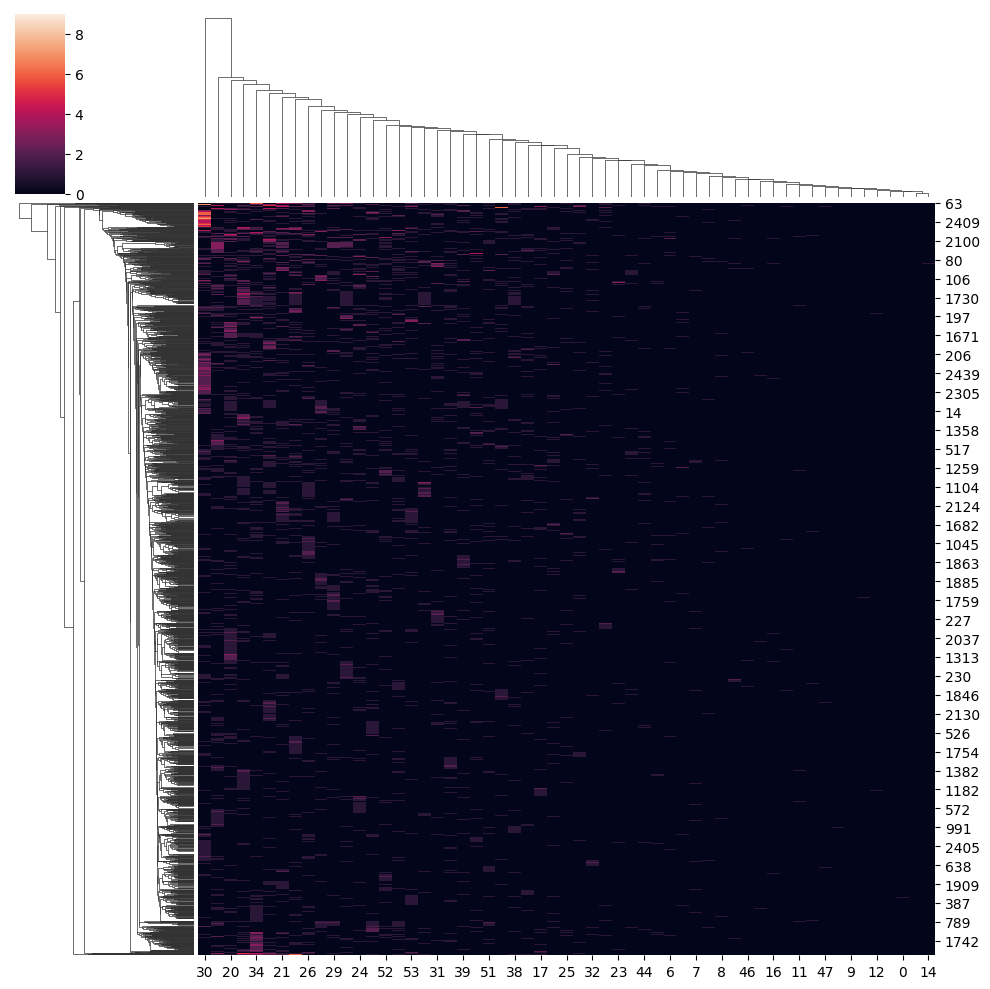

In [5]:
sns.clustermap(ec_adata.X.A)

c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\statsmodels\stats\correlation_tools.py:90: IterationLimitWarning: 
Maximum iteration reached.

  warnings.warn(iteration_limit_doc, IterationLimitWarning)


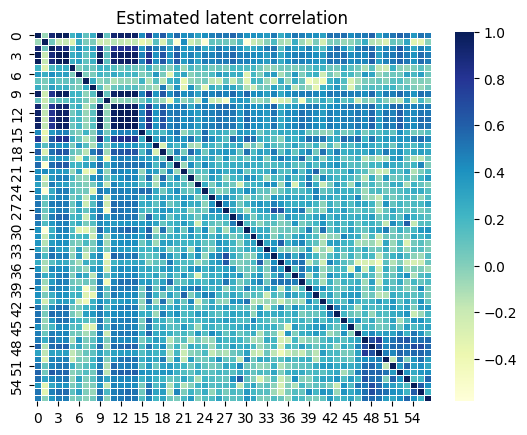

In [6]:
tps = ['tru' for i in range(ec_adata.shape[1])]
ec_est = latentcor(ec_adata.layers['sqrt_counts'].A, tps=tps, method='approx', use_nearPD=True, nu=0.001, showplot=True)

In [7]:
ec_ggl_latentcor = gg_lasso_network_analysis(N=ec_adata.shape[0], estimate=ec_est)
ec_ggl_latentcor.create_problem(S_col="R", latent=False)
ec_ggl_latentcor.model_selection(lambda1_range=np.logspace(0, -5, 200))

 
SINGLE GRAPHICAL LASSO PROBLEM 
Regularization parameters:
{'lambda1': 0.05, 'mu1': None}
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 59 iterations with status: optimal.
ADMM terminated after 23 iterations wi

In [8]:
ec_sol_latentcor = ec_ggl_latentcor.P.solution.precision_

<Axes: >

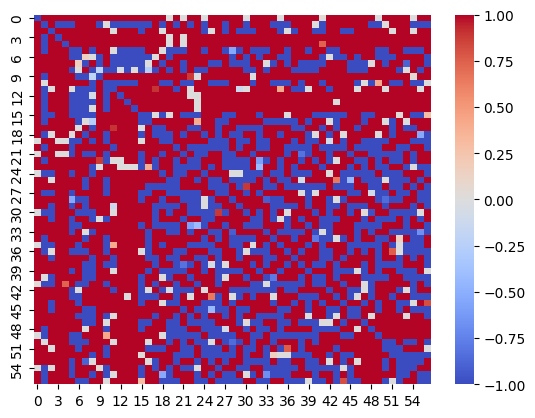

In [51]:
sns.heatmap(ec_sol_latentcor*-1, cmap="coolwarm", vmin=-1, vmax=1)

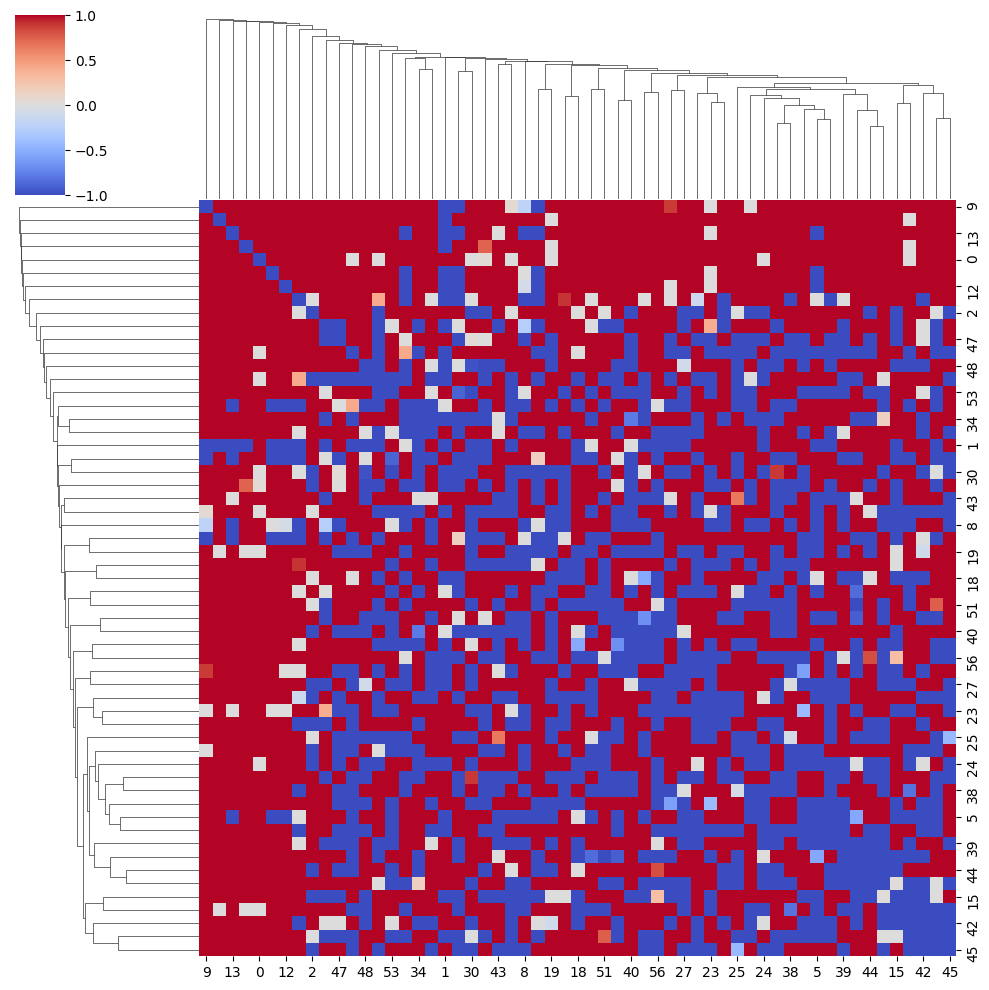

In [10]:
sns.clustermap(ec_sol_latentcor*-1, cmap="coolwarm", vmin=-1, vmax=1)

### EFM

In [11]:
efm_mudata = md.read("../data/preprocessed/efm_mudata_preprocessed.h5mu")
efm_adata = efm_mudata["rRNA_genes"].copy()
del(efm_mudata)
print(gc.collect())
efm_adata

c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


1527


c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\mudata\_core\mudata.py:491: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


AnnData object with n_obs × n_vars = 4804 × 60
    obs: 'strains', 'n_genes_by_counts', 'total_counts', 'n_counts'
    var: 'strains', 'matchin_protein', 'protein', 'n_cells', 'protein_name', 'rRNA', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'genes_match', 'protein_match', 'unmatch_genes'
    layers: 'log1p', 'norm_counts', 'raw_counts', 'sqrt_counts'

In [12]:
print(efm_adata.shape)
sc.pp.filter_genes(efm_adata, min_counts=1)
print(efm_adata.shape)
sc.pp.filter_cells(efm_adata, min_counts=1)
print(efm_adata.shape)

(4804, 60)
(4804, 60)
(4564, 60)


In [13]:
print("Sparity:\t\t", calc_sparsity(efm_adata.X.A))
print("Mean counts per gene:\t", np.mean(np.sum(efm_adata.X.A, axis=1)))
print("Median counts per gene:\t", np.median(np.sum(efm_adata.X.A, axis=1)))
print("Mean genes per cell: \t", np.mean(np.sum(efm_adata.X.A, axis=0)))
print("Median genes per cell:\t", np.median(np.sum(efm_adata.X.A, axis=0)))

Sparity:		 0.9319127957931639
Mean counts per gene:	 4.0852323
Median counts per gene:	 3.0
Mean genes per cell: 	 310.75
Median genes per cell:	 235.5


c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


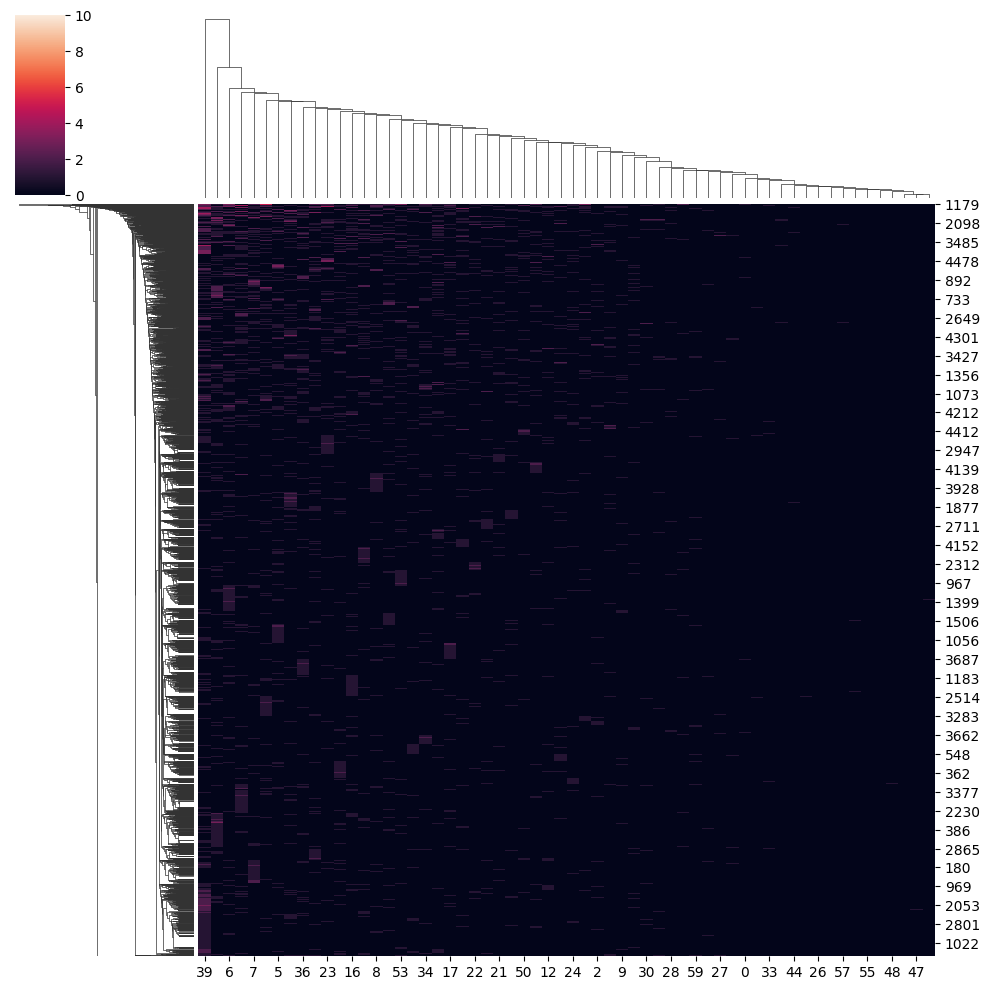

In [14]:
sns.clustermap(efm_adata.X.A)

c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\statsmodels\stats\correlation_tools.py:90: IterationLimitWarning: 
Maximum iteration reached.

  warnings.warn(iteration_limit_doc, IterationLimitWarning)


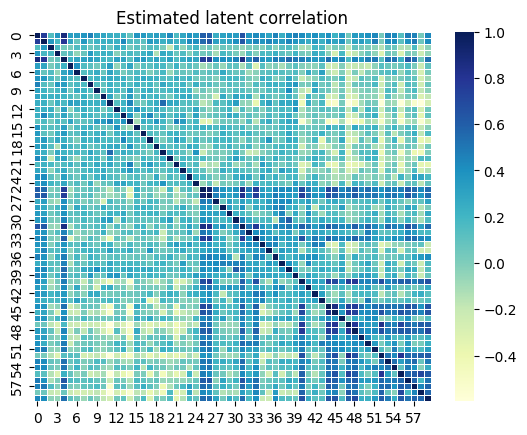

In [15]:
tps = ['tru' for i in range(efm_adata.shape[1])]
efm_est = latentcor(efm_adata.layers['sqrt_counts'].A, tps=tps, method='approx', use_nearPD=True, nu=0.001, showplot=True)

In [16]:
efm_ggl_latentcor = gg_lasso_network_analysis(N=efm_adata.shape[0], estimate=efm_est)
efm_ggl_latentcor.create_problem(S_col="R", latent=False)
efm_ggl_latentcor.model_selection(lambda1_range=np.logspace(0, -5, 200))

 
SINGLE GRAPHICAL LASSO PROBLEM 
Regularization parameters:
{'lambda1': 0.05, 'mu1': None}
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 45 iterations wi

In [17]:
efm_sol_latentcor = efm_ggl_latentcor.P.solution.precision_

<Axes: >

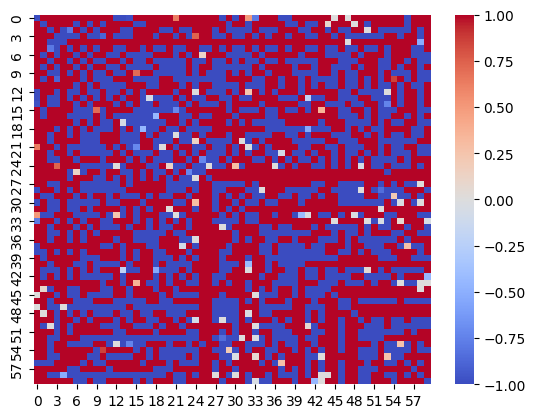

In [18]:
sns.heatmap(efm_sol_latentcor*-1, cmap="coolwarm", vmin=-1, vmax=1)

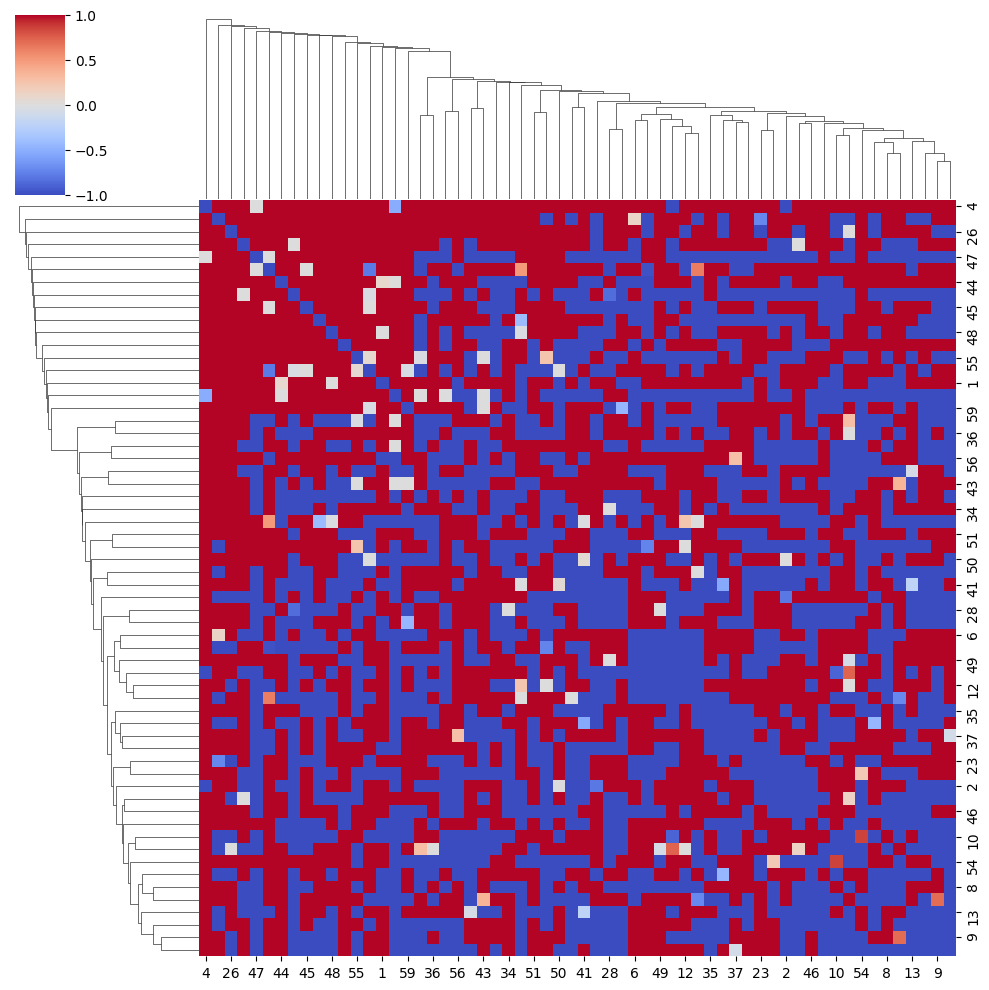

In [19]:
sns.clustermap(efm_sol_latentcor*-1, cmap="coolwarm", vmin=-1, vmax=1)

In [20]:
path_nSBM = '../data/raw/mudata_nSBM_hierarchy_2_final_4_species.h5mu'
data_nSBM = md.read_h5mu(path_nSBM)
data_nSBM

c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
c:\Users\Jan\.conda\envs\bacdrop\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


MuData object with n_obs × n_vars = 36469 × 33412
  3 modalities
    SC_genes:	36469 x 14009
      obs:	'strains'
      var:	'strains', 'matchin_protein', 'protein'
      uns:	'genes_match', 'protein_match', 'unmatch_genes'
    SC_proteins:	36469 x 13687
      obs:	'strains'
      var:	'genes_mapping', 'strains'
      uns:	'Consensus_tree', 'protein_adjacency_matrix', 'protein_match', 'protein_unmatch'
      varm:	'protein_hierarchy'
    SC_PCs:	36469 x 5716
      obs:	'strains'
      var:	'PCs_match'
      uns:	'Consensus_tree_PCs', 'PCs', 'PCs_to_genes', 'PCs_unmatch', 'Purity_info', 'Purity_info_unique', 'protein_match'
      varm:	'protein_hierarchy_PCs'

In [25]:
data_nSBM["SC_proteins"].varm["protein_hierarchy"]

,lev0,lev1,lev2,lev3,lev4,lev5,lev6,lev_root
NP_052605.1,lev00totlen16795,forDFlev16795,forDFlev26795,forDFlev36795,forDFlev46795,forDFlev56795,forDFlev66795,root
NP_052606.1,lev00totlen17549,forDFlev17549,forDFlev27549,forDFlev37549,forDFlev47549,forDFlev57549,forDFlev67549,root
NP_052608.1,lev00totlen15594,forDFlev15594,forDFlev25594,forDFlev35594,forDFlev45594,forDFlev55594,forDFlev65594,root
NP_052609.1,lev00totlen12063,forDFlev12063,forDFlev22063,forDFlev32063,forDFlev42063,forDFlev52063,forDFlev62063,root
NP_052610.1,lev00totlen1576,forDFlev1576,forDFlev2576,forDFlev3576,forDFlev4576,forDFlev5576,forDFlev6576,root
...,...,...,...,...,...,...,...,...
WP_004152553.1,lev00totlen14198,forDFlev14198,forDFlev24198,forDFlev34198,forDFlev44198,forDFlev54198,forDFlev64198,root
WP_004178188.1,lev00totlen11303,forDFlev11303,forDFlev21303,forDFlev31303,forDFlev41303,forDFlev51303,forDFlev61303,root
WP_228131004.1,lev00totlen11253,forDFlev11253,forDFlev21253,forDFlev31253,forDFlev41253,forDFlev51253,forDFlev61253,root
WP_228131000.1,lev020totlen21057,forDFlev11057,forDFlev21057,forDFlev31057,forDFlev41057,forDFlev51057,forDFlev61057,root


In [34]:
ec_adata.var['PC'] = data_nSBM["SC_proteins"].varm["protein_hierarchy"].loc[ec_adata.var["protein"]]["lev6"].values
efm_adata.var['PC'] = data_nSBM["SC_proteins"].varm["protein_hierarchy"].loc[efm_adata.var["protein"]]["lev6"].values

In [38]:
ec_adata.var.head()

,strains,matchin_protein,protein,n_cells,protein_name,rRNA,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_counts,PC
cds-NP_308053.1,GSM5456505_PsA_CDS,match,NP_308053.1,7,NP_308053.1 30S ribosomal subunit protein S20 ...,True,2,0.000792,99.920761,2.0,2.0,forDFlev61583
cds-NP_308198.1,GSM5456505_PsA_CDS,match,NP_308198.1,205,NP_308198.1 30S ribosomal subunit protein S2 [...,True,107,0.043978,95.760697,111.0,111.0,forDFlev6944
cds-NP_308942.1,GSM5456505_PsA_CDS,match,NP_308942.1,33,NP_308942.1 ribosomal protein S12 methylthiotr...,True,12,0.004754,99.524564,12.0,12.0,forDFlev62548
cds-NP_308959.1,GSM5456505_PsA_CDS,match,NP_308959.1,1,NP_308959.1 ribosomal protein S6 modification ...,True,1,0.000396,99.960380,1.0,1.0,forDFlev6551
cds-NP_309015.2,GSM5456505_PsA_CDS,match,NP_309015.2,4,NP_309015.2 ribosomal protein S12 methylthiotr...,True,2,0.000792,99.920761,2.0,2.0,forDFlev6704


In [39]:
efm_adata.var.head()

,strains,matchin_protein,protein,n_cells,protein_name,rRNA,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_counts,PC
cds-WP_002286913.1,GSM5456506_Kp_CDS,match,WP_002286913.1,47,WP_002286913.1 MULTISPECIES: 50S ribosomal pro...,True,30,0.006661,99.375520,32.0,32.0,forDFlev65605
cds-WP_002287321.1,GSM5456506_Kp_CDS,match,WP_002287321.1,46,WP_002287321.1 MULTISPECIES: 30S ribosomal pro...,True,32,0.006661,99.333888,32.0,32.0,forDFlev6102
cds-WP_002287505.1,GSM5456506_Kp_CDS,match,WP_002287505.1,251,WP_002287505.1 MULTISPECIES: 30S ribosomal pro...,True,166,0.036636,96.544546,176.0,176.0,forDFlev64834
cds-WP_002288370.1,GSM5456506_Kp_CDS,match,WP_002288370.1,278,WP_002288370.1 MULTISPECIES: 30S ribosomal pro...,True,205,0.045171,95.732723,217.0,217.0,forDFlev62685
cds-WP_002288372.1,GSM5456506_Kp_CDS,match,WP_002288372.1,15,WP_002288372.1 MULTISPECIES: 50S ribosomal pro...,True,10,0.002082,99.791840,10.0,10.0,forDFlev63746


In [40]:
def extract_part(text):
    parts = text.split()
    filtered_parts = parts[1:-5]  # Remove the last part
    result = ' '.join(filtered_parts)  # Join the remaining parts
    return result

In [41]:
ec_adata.var["protein_name"] = ec_adata.var["protein_name"].apply(lambda x: extract_part(x))
efm_adata.var["protein_name"] = efm_adata.var["protein_name"].apply(lambda x: extract_part(x))

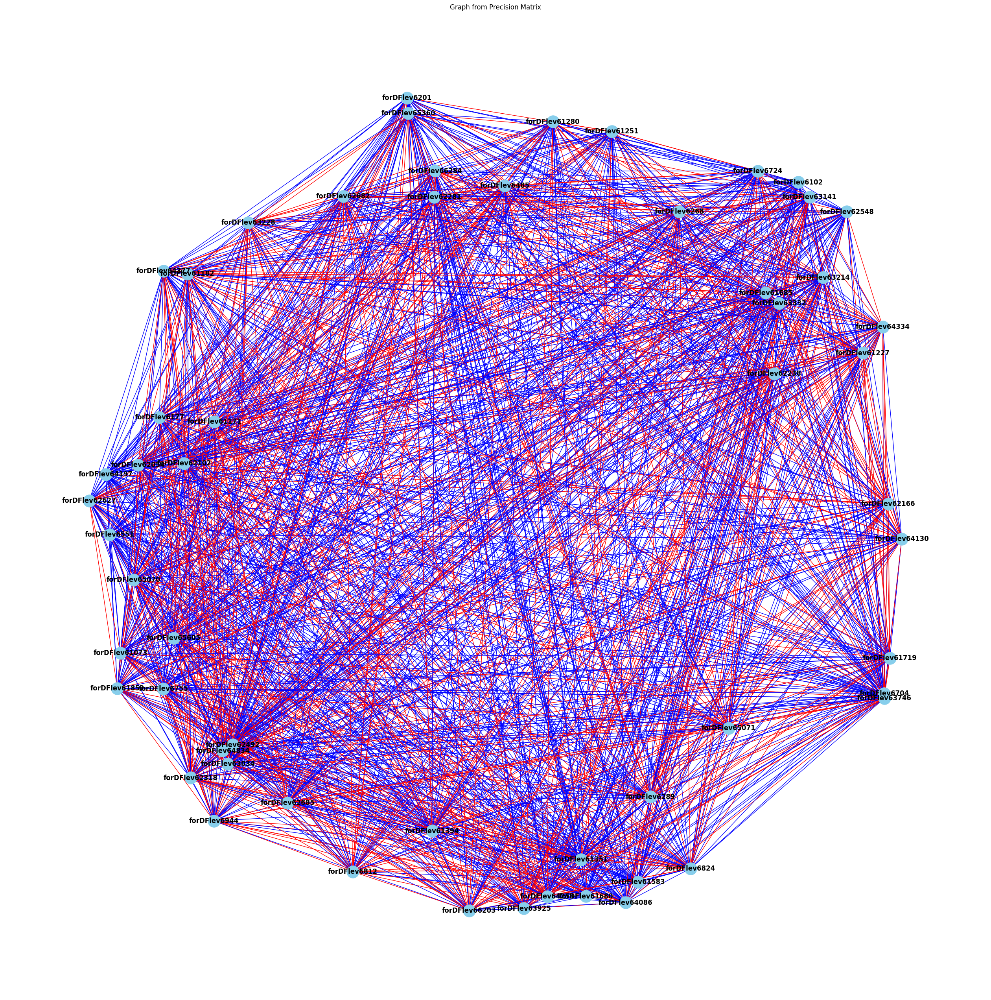

In [49]:
ec_G = nx.Graph()

# Add nodes to the graph
for idx, row in ec_adata.var.iterrows():
    ec_G.add_node(row['PC'])

# Add edges to the graph based on the weights
n = len(ec_adata.var)
for i in range(n):
    for j in range(i + 1, n):
        weight = ec_sol_latentcor[i, j]
        if weight != 0:
            ec_G.add_edge(ec_adata.var.iloc[i]['PC'], ec_adata.var.iloc[j]['PC'], weight=weight)

# Set edge colors based on weight sign
edge_colors = []
for edge in ec_G.edges(data=True):
    weight = edge[2]['weight']
    if weight > 0:
        edge_colors.append('red')  # Positive edge
    elif weight < 0:
        edge_colors.append('blue')  # Negative edge

# Draw the graph
pos = nx.spring_layout(ec_G)
plt.figure(figsize=(25, 25))
nx.draw(ec_G, pos, with_labels=True, node_size=500, node_color='skyblue', font_size=12, font_weight='bold', edge_color=edge_colors)
plt.title('Graph from Precision Matrix')
plt.show()

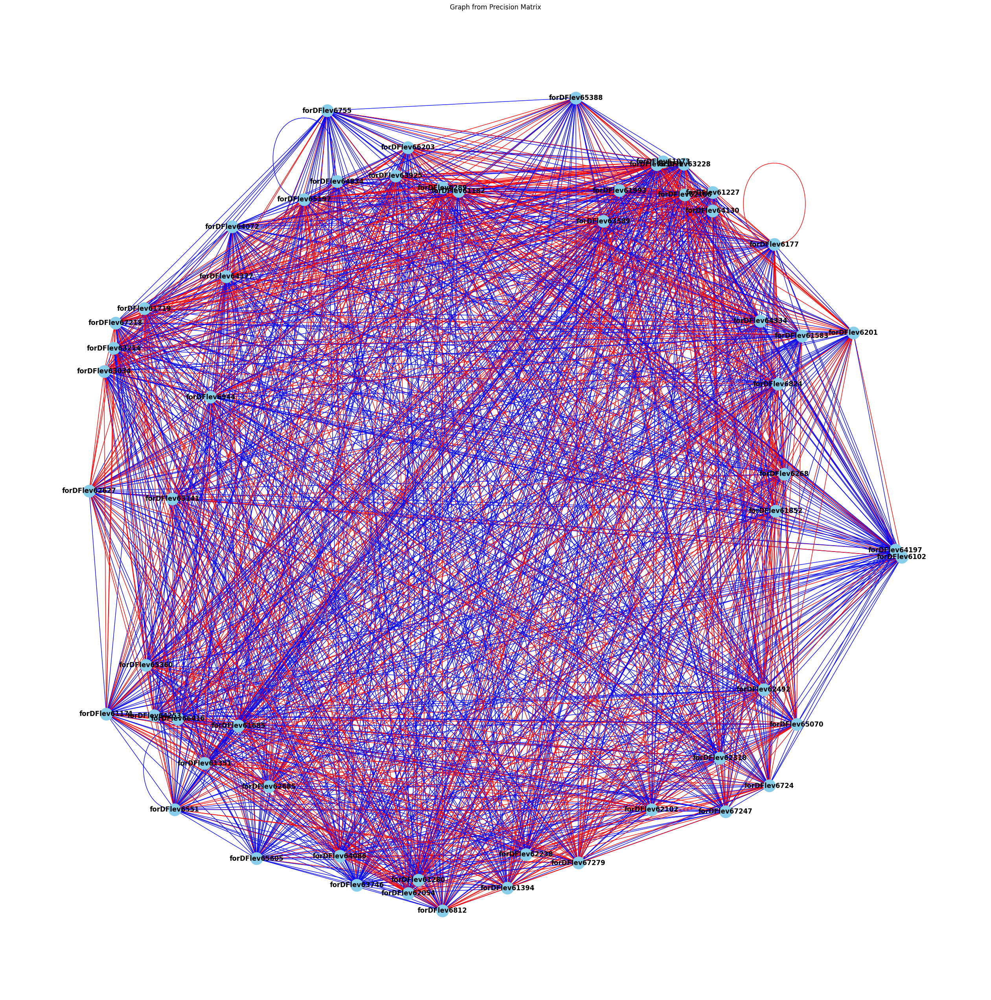

In [48]:
efm_G = nx.Graph()

# Add nodes to the graph
for idx, row in efm_adata.var.iterrows():
    efm_G.add_node(row['PC'])

# Add edges to the graph based on the weights
n = len(efm_adata.var)
for i in range(n):
    for j in range(i + 1, n):
        weight = efm_sol_latentcor[i, j]
        if weight != 0:
            efm_G.add_edge(efm_adata.var.iloc[i]['PC'], efm_adata.var.iloc[j]['PC'], weight=weight)

# Set edge colors based on weight sign
edge_colors = []
for edge in efm_G.edges(data=True):
    weight = edge[2]['weight']
    if weight > 0:
        edge_colors.append('red')  # Positive edge
    elif weight < 0:
        edge_colors.append('blue')  # Negative edge

# Draw the graph
pos = nx.spring_layout(efm_G)
plt.figure(figsize=(25, 25))
nx.draw(efm_G, pos, with_labels=True, node_size=500, node_color='skyblue', font_size=12, font_weight='bold', edge_color=edge_colors)
plt.title('Graph from Precision Matrix')
plt.show()

### Getting the top 5 correlations for both species

<Axes: >

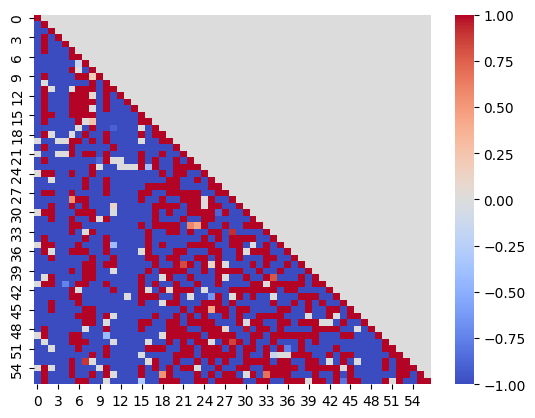

In [81]:
ec_sol_latentcor = ec_sol_latentcor*-1
ec_sol_latentcor[np.triu_indices(ec_sol_latentcor.shape[0])] = 0
np.fill_diagonal(ec_sol_latentcor, 1)
sns.heatmap(ec_sol_latentcor, vmin=-1, vmax=1, cmap="coolwarm")

In [82]:
flat_dummy = ec_sol_latentcor.flatten()
ec_top5_corr = np.argsort(flat_dummy)[::-1][:5]

In [83]:
ec_top5_row_indices, ec_top5_col_indices = np.unravel_index(ec_top5_corr, ec_sol_latentcor.shape)

In [91]:
for i in range(5):
    print(f"Top {i+1} entry:")
    print(ec_adata.var.iloc[ec_top5_row_indices[i]][["protein", "protein_name", "PC"]])
    print(ec_adata.var.iloc[ec_top5_col_indices[i]][["protein", "protein_name", "PC"]])
    print("____________________")

Top 1 entry:
protein                               NP_312131.1
protein_name    50S ribosomal subunit protein L13
PC                                  forDFlev64086
Name: cds-NP_312131.1, dtype: object
protein                              NP_312130.1
protein_name    30S ribosomal subunit protein S9
PC                                 forDFlev64834
Name: cds-NP_312130.1, dtype: object
____________________
Top 2 entry:
protein                              NP_312209.1
protein_name    50S ribosomal subunit protein L2
PC                                 forDFlev65071
Name: cds-NP_312209.1, dtype: object
protein                               NP_312202.1
protein_name    50S ribosomal subunit protein L14
PC                                  forDFlev66203
Name: cds-NP_312202.1, dtype: object
____________________
Top 3 entry:
protein                               NP_312186.1
protein_name    50S ribosomal subunit protein L17
PC                                  forDFlev63228
Name: cds-NP_312186.1, dtyp

<Axes: >

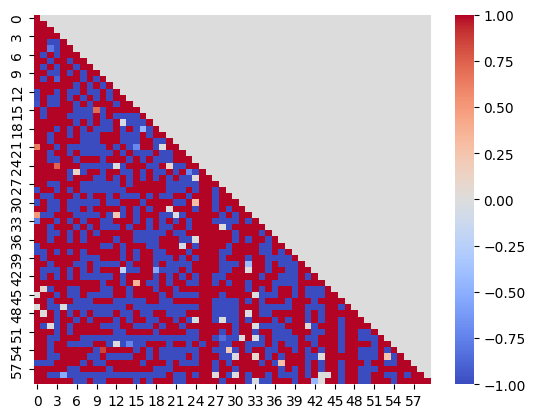

In [92]:
efm_sol_latentcor = efm_sol_latentcor*-1
efm_sol_latentcor[np.triu_indices(efm_sol_latentcor.shape[0])] = 0
np.fill_diagonal(efm_sol_latentcor, 1)
sns.heatmap(efm_sol_latentcor, vmin=-1, vmax=1, cmap="coolwarm")

In [93]:
flat_dummy = efm_sol_latentcor.flatten()
efm_top5_corr = np.argsort(flat_dummy)[::-1][:5]

In [94]:
efm_top5_row_indices, efm_top5_col_indices = np.unravel_index(efm_top5_corr, efm_sol_latentcor.shape)

In [95]:
for i in range(5):
    print(f"Top {i+1} entry:")
    print(efm_adata.var.iloc[efm_top5_row_indices[i]][["protein", "protein_name", "PC"]])
    print(efm_adata.var.iloc[efm_top5_col_indices[i]][["protein", "protein_name", "PC"]])
    print("____________________")

Top 1 entry:
protein         WP_002294318.1
protein_name     MULTISPECIES:
PC               forDFlev61351
Name: cds-WP_002294318.1, dtype: object
protein         WP_002290274.1
protein_name     MULTISPECIES:
PC                forDFlev6201
Name: cds-WP_002290274.1, dtype: object
____________________
Top 2 entry:
protein         WP_002290970.1
protein_name     MULTISPECIES:
PC               forDFlev67279
Name: cds-WP_002290970.1, dtype: object
protein         WP_002288669.1
protein_name     MULTISPECIES:
PC               forDFlev66203
Name: cds-WP_002288669.1, dtype: object
____________________
Top 3 entry:
protein         WP_002287505.1
protein_name     MULTISPECIES:
PC               forDFlev64834
Name: cds-WP_002287505.1, dtype: object
protein         WP_002287321.1
protein_name     MULTISPECIES:
PC                forDFlev6102
Name: cds-WP_002287321.1, dtype: object
____________________
Top 4 entry:
protein         WP_002297320.1
protein_name     MULTISPECIES:
PC               forDFlev